## read data

In [1]:
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt
import networkx as nx
import operator

In [2]:
df = pd.read_csv('datos/datos.csv',sep='\t')

In [3]:
df

,Apellido Paterno,Apellido Materno,Nombres,Año,Letra,Comuna,Provincia,Región,Sexo,Oficina
0,PADILLA,RODRÍGUEZ,ANGÉLICA ASUNCIÓN,1994,b),TEMUCO,CAUTÍN,REGIÓN DE LA ARAUCANIA,Femenino,SUBDIRECCIÓN NACIONAL TEMUCO
1,ANTILEO,JARAMILLO,TERESA DEL CARMEN,1994,a),TEODORO SCHMIDT,CAUTÍN,REGIÓN DE LA ARAUCANIA,Femenino,SUBDIRECCIÓN NACIONAL TEMUCO
2,RIVERA,s/i,MARIA ALEJANDRA,1994,b),VILLARRICA,CAUTÍN,REGIÓN DE LA ARAUCANIA,Femenino,SUBDIRECCIÓN NACIONAL TEMUCO
3,SANHUEZA,SANHUEZA,MARTA DEL CARMEN,1994,b),VILLARRICA,CAUTÍN,REGIÓN DE LA ARAUCANIA,Femenino,SUBDIRECCIÓN NACIONAL TEMUCO
4,ABURTO,PALMA,BERNARDO JESÚS,2001,a),PERQUENCO,CAUTÍN,REGIÓN DE LA ARAUCANIA,Masculino,SUBDIRECCIÓN NACIONAL TEMUCO
5,TORO,SOTO,ANDRÉS,1994,b),TEMUCO,CAUTÍN,REGIÓN DE LA ARAUCANIA,Masculino,SUBDIRECCIÓN NACIONAL TEMUCO
6,VIDAL,BENAVENTE,ETELVINA DEL CARMEN,1994,b),NUEVA IMPERIAL,CAUTÍN,REGIÓN DE LA ARAUCANIA,Femenino,SUBDIRECCIÓN NACIONAL TEMUCO
7,CHÁVEZ,ESCOBAR,JUAN ALBERTO,1996,a),TEMUCO,CAUTÍN,REGIÓN DE LA ARAUCANIA,Masculino,SUBDIRECCIÓN NACIONAL TEMUCO
8,MORENO,GONZÁLEZ,JOSÉ EUSEBIO,1994,b),TEMUCO,CAUTÍN,REGIÓN DE LA ARAUCANIA,Masculino,SUBDIRECCIÓN NACIONAL TEMUCO
9,ROMERO,BEMAVENTE,SEGUNDO PEDRO,1994,b),TEMUCO,CAUTÍN,REGIÓN DE LA ARAUCANIA,Masculino,SUBDIRECCIÓN NACIONAL TEMUCO


## basic statistics

In [4]:
## count frequency by year

years=[y for y in df.Año]
counts=dict(Counter(years))
counts={k: v for k, v in sorted(counts.items(), key=lambda item: item[0])}

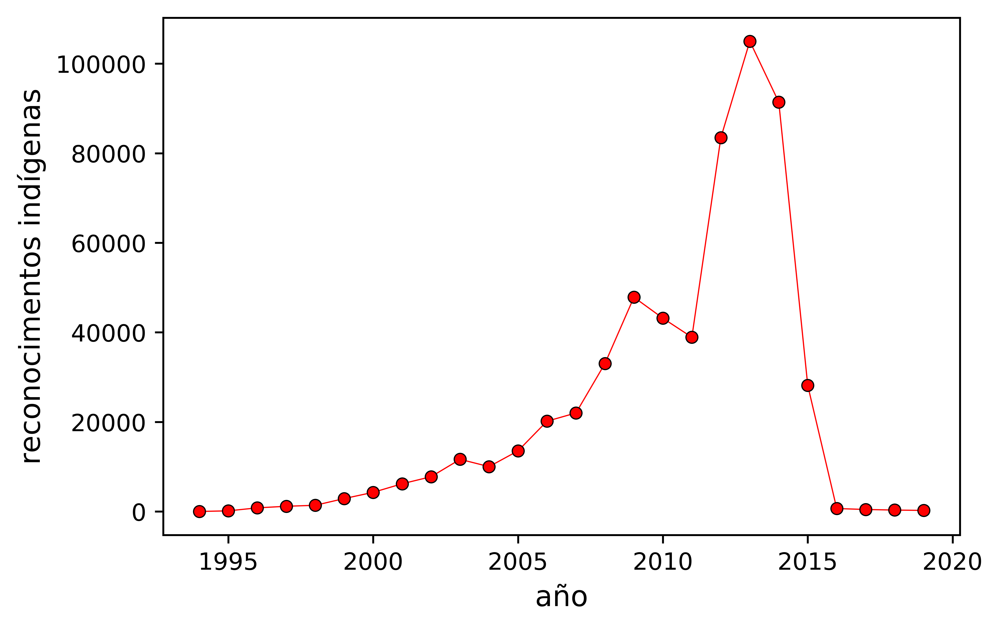

In [5]:
fig, ax = plt.subplots(dpi=800)

#for language in romance_names:

plt.plot(counts.keys(),counts.values(),marker='o',color='r',markersize=5,markeredgecolor='k',markeredgewidth=0.5,fillstyle='full',clip_on=True,linewidth=0.5)

plt.grid(False)
#plt.legend(loc='best')
#plt.xlim([-4.25,7.25])
#plt.ylim([-1.75,2.25])
plt.ylabel(r'reconocimentos indígenas',fontsize=12)
plt.xlabel(r'año',fontsize=12)
plt.rcParams.update({'font.size': 10})
plt.savefig('figuras/frecuencia_reconocimientos.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

## some statistics by year

In [6]:
## count letters by year

letters=[l for l in df.Letra]

In [7]:
letters[:10]

['b)', 'a)', 'b)', 'b)', 'a)', 'b)', 'b)', 'a)', 'b)', 'b)']

In [8]:
L=[]

for l in letters:
    if l.startswith('c)'):
        L+=['c)']
    else:
        L+=[l]

In [9]:
letters_count={l:[] for l in list(set(L))} 

for i in range(len(L)):
    letters_count[L[i]]+=[years[i]]

In [10]:
letters_count={key:dict(Counter(letters_count[key])) for key in letters_count.keys()}

In [11]:
letters_count={key:{k: v for k, v in sorted(letters_count[key].items(), key=lambda item: item[0])} for key in letters_count.keys()}

In [12]:
#letters_count

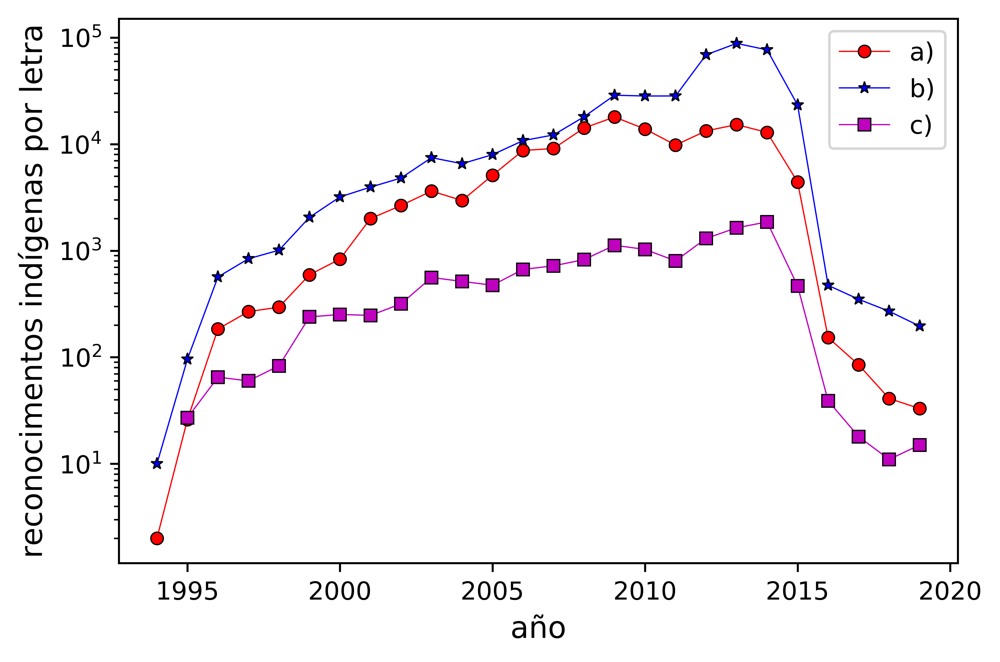

In [13]:
fig, ax = plt.subplots(dpi=800)

#for language in romance_names:

plt.semilogy(letters_count['a)'].keys(),letters_count['a)'].values(),marker='o',color='r',markersize=5,markeredgecolor='k',markeredgewidth=0.5,fillstyle='full',clip_on=True,linewidth=0.5,label='a)')
plt.semilogy(letters_count['b)'].keys(),letters_count['b)'].values(),marker='*',color='b',markersize=5,markeredgecolor='k',markeredgewidth=0.5,fillstyle='full',clip_on=True,linewidth=0.5,label='b)')
plt.semilogy(letters_count['c)'].keys(),letters_count['c)'].values(),marker='s',color='m',markersize=5,markeredgecolor='k',markeredgewidth=0.5,fillstyle='full',clip_on=True,linewidth=0.5,label='c)')

plt.grid(False)
plt.legend(loc='best')
#plt.xlim([-4.25,7.25])
#plt.ylim([-1.75,2.25])
plt.ylabel(r'reconocimentos indígenas por letra',fontsize=12)
plt.xlabel(r'año',fontsize=12)
plt.rcParams.update({'font.size': 10})
plt.savefig('figuras/frecuencia_reconocimientos_letra.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

In [14]:
## count regions by year

regions=[r for r in df.Región]

In [15]:
set(regions)

{'DEL LIBERTADOR GENERAL BERNARDO OHIGGINS',
 'ISLA DE PASCUA',
 'REGIÓN DE ANTOFAGASTA',
 'REGIÓN DE ARICA PARINACOTA',
 'REGIÓN DE ATACAMA',
 'REGIÓN DE AYSÉN DEL GENERAL CARLOS IBÁÑEZ DEL CAMPO',
 'REGIÓN DE COQUIMBO',
 'REGIÓN DE LA ARAUCANIA',
 'REGIÓN DE LOS LAGOS',
 'REGIÓN DE LOS RIOS',
 'REGIÓN DE MAGALLANES Y DE LA ANTÁRTICA CHILENA',
 'REGIÓN DE TARAPACÁ.',
 'REGIÓN DE VALPARAISO',
 'REGIÓN DEL BÍO BÍO',
 'REGIÓN METROPOLITANA DE SANTIAGO',
 'REGIÓN ÑUBLE',
 'VII REGION MAULE'}

In [16]:
regions_count={r:[] for r in list(set(regions))} 

for i in range(len(regions)):
    regions_count[regions[i]]+=[years[i]]

In [17]:
regions_count={key:dict(Counter(regions_count[key])) for key in regions_count.keys()}

In [18]:
regions_count={key:{k: v for k, v in sorted(regions_count[key].items(), key=lambda item: item[0])} for key in regions_count.keys()}

In [19]:
regions_count

{'REGIÓN DE MAGALLANES Y DE LA ANTÁRTICA CHILENA': {1996: 225,
  1997: 324,
  1998: 516,
  1999: 980,
  2000: 1528,
  2001: 1831,
  2002: 1633,
  2003: 2367,
  2004: 1330,
  2005: 955,
  2006: 915,
  2007: 1283,
  2008: 1387,
  2009: 2304,
  2010: 2517,
  2011: 1154,
  2012: 2450,
  2013: 2461,
  2014: 2699,
  2015: 596,
  2018: 3,
  2019: 1},
 'REGIÓN DE TARAPACÁ.': {1995: 2,
  1996: 26,
  1997: 22,
  1998: 33,
  1999: 395,
  2000: 781,
  2001: 1174,
  2002: 1471,
  2003: 2070,
  2004: 1653,
  2005: 2019,
  2006: 2545,
  2007: 2408,
  2008: 2684,
  2009: 3705,
  2010: 3283,
  2011: 2950,
  2012: 3711,
  2013: 4169,
  2014: 3564,
  2015: 866,
  2016: 133,
  2017: 25,
  2018: 32,
  2019: 21},
 'ISLA DE PASCUA': {2002: 1,
  2004: 69,
  2005: 292,
  2006: 351,
  2007: 196,
  2008: 74,
  2009: 300,
  2010: 302,
  2011: 173,
  2012: 281,
  2013: 464,
  2014: 350,
  2015: 52},
 'REGIÓN DE LOS LAGOS': {1995: 2,
  1996: 1,
  1997: 1,
  1998: 3,
  1999: 2,
  2000: 1,
  2001: 4,
  2002: 21,
  20

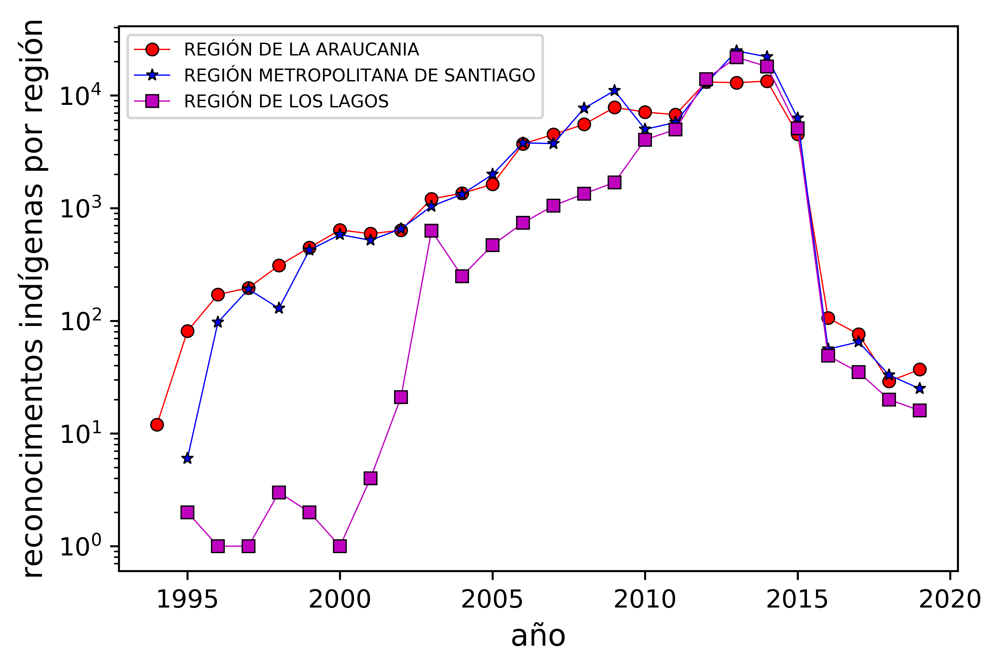

In [20]:
fig, ax = plt.subplots(dpi=800)

#for language in romance_names:

colors={'REGIÓN DE LA ARAUCANIA':['o','r'],'REGIÓN METROPOLITANA DE SANTIAGO':['*','b'],'REGIÓN DE LOS LAGOS':['s','m']}

for key in colors.keys():#regions_count.keys():

    plt.semilogy(regions_count[key].keys(),regions_count[key].values(),marker=colors[key][0],color=colors[key][1],markersize=5,markeredgecolor='k',markeredgewidth=0.5,fillstyle='full',clip_on=True,linewidth=0.5,label=key)

plt.grid(False)
plt.legend(loc='best',fontsize=7)
#plt.xlim([-4.25,7.25])
#plt.ylim([-1.75,2.25])
plt.ylabel(r'reconocimentos indígenas por región',fontsize=12)
plt.xlabel(r'año',fontsize=12)
plt.rcParams.update({'font.size': 10})
plt.savefig('figuras/frecuencia_reconocimientos_region.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

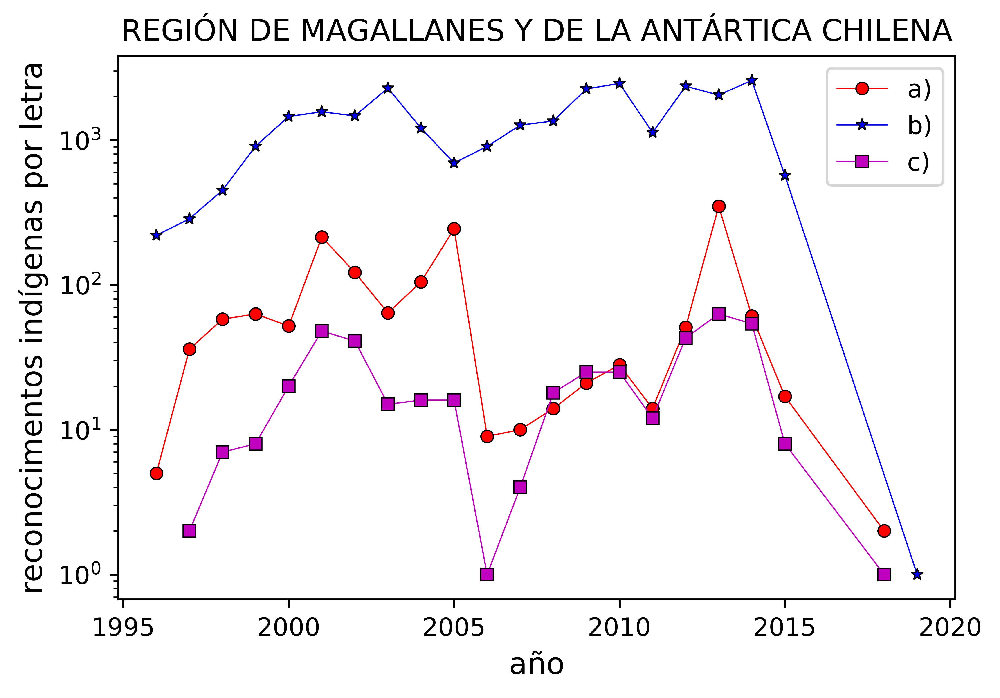

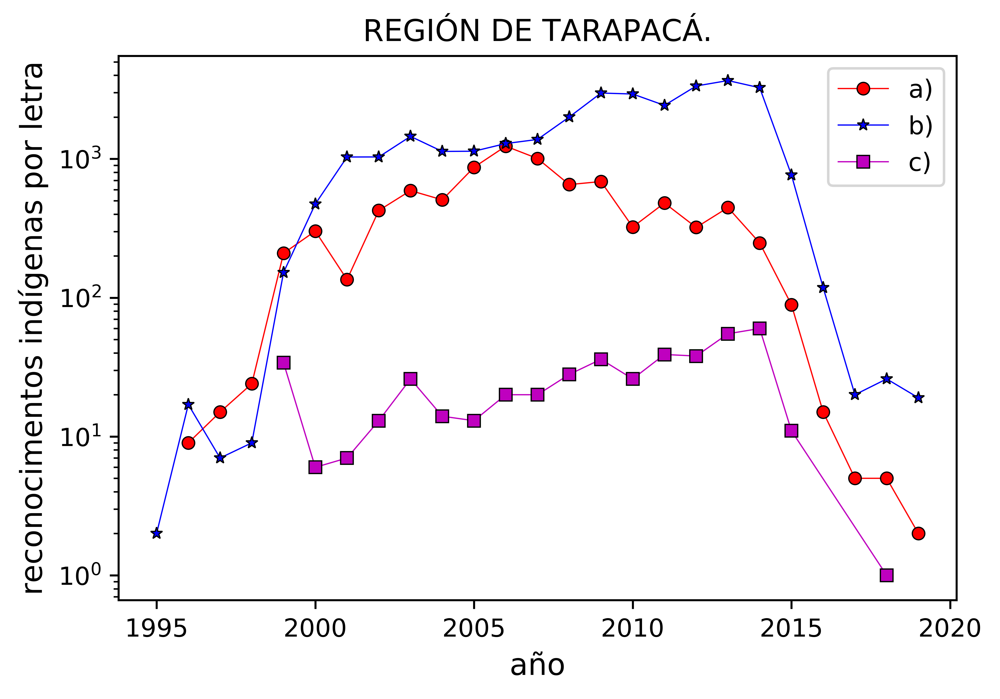

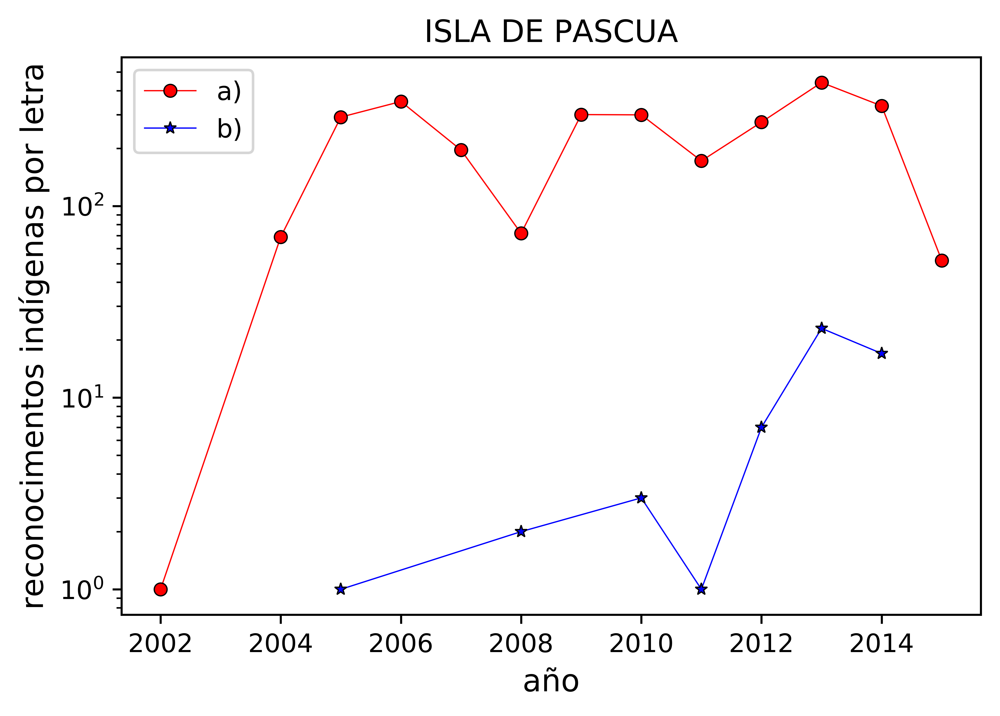

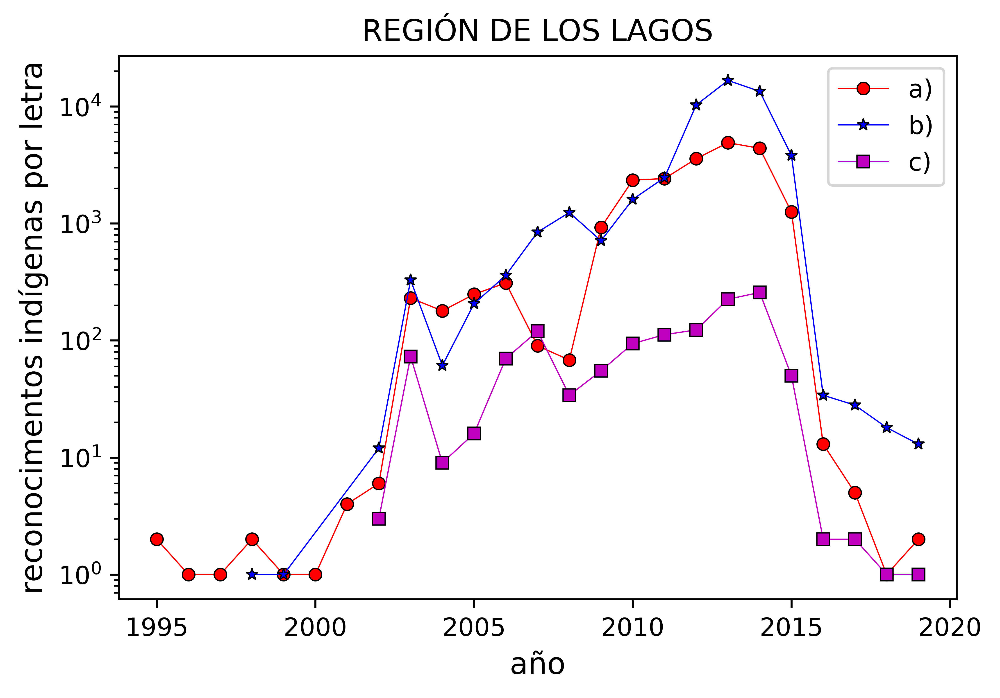

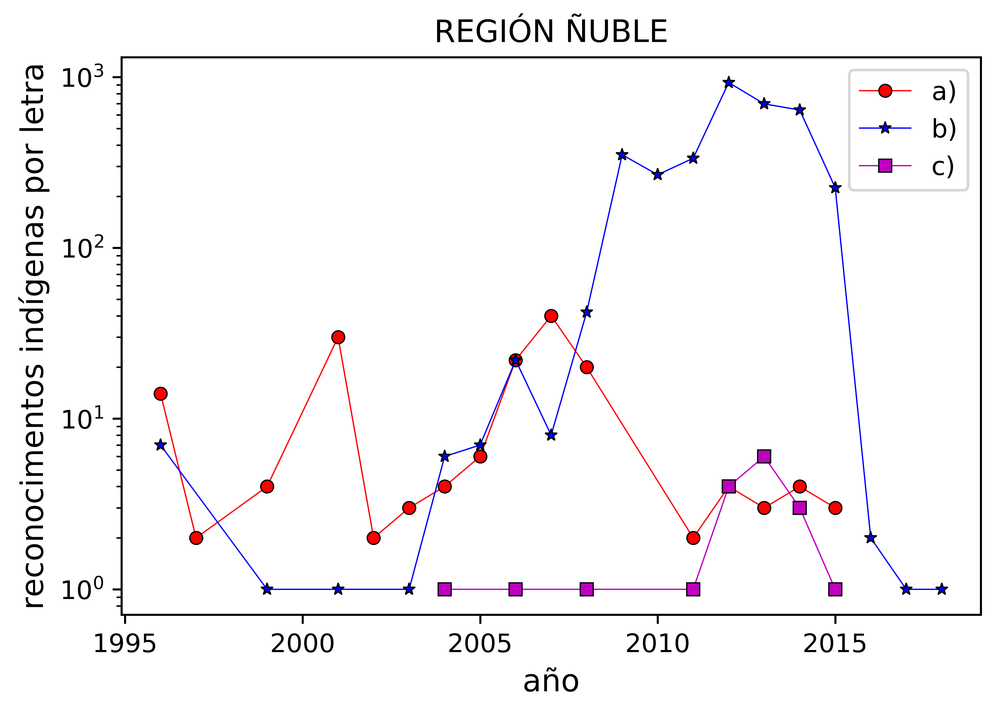

...

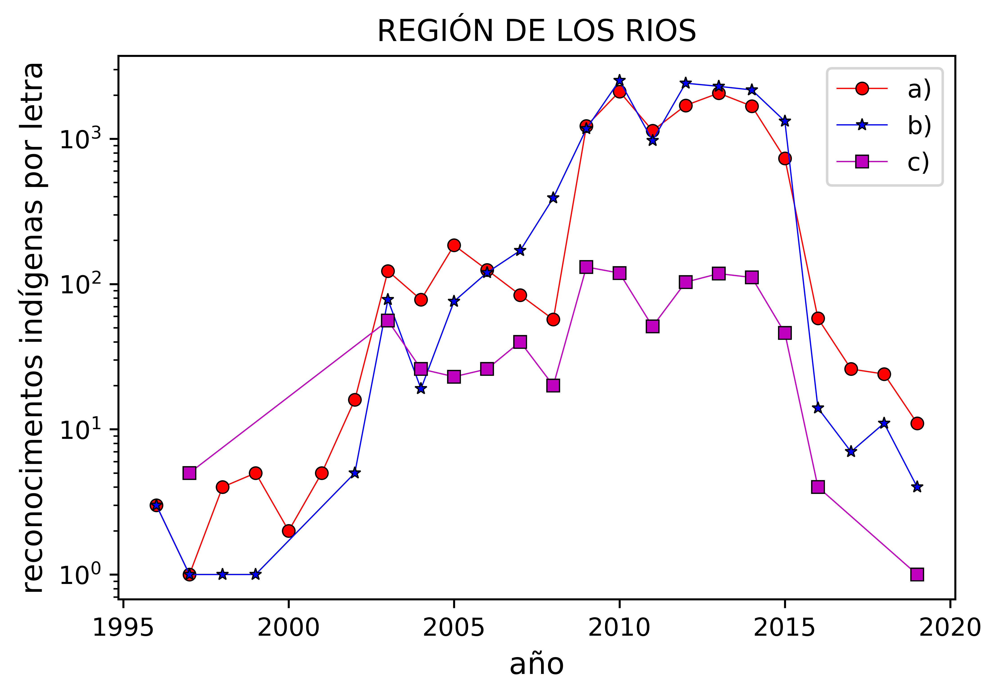

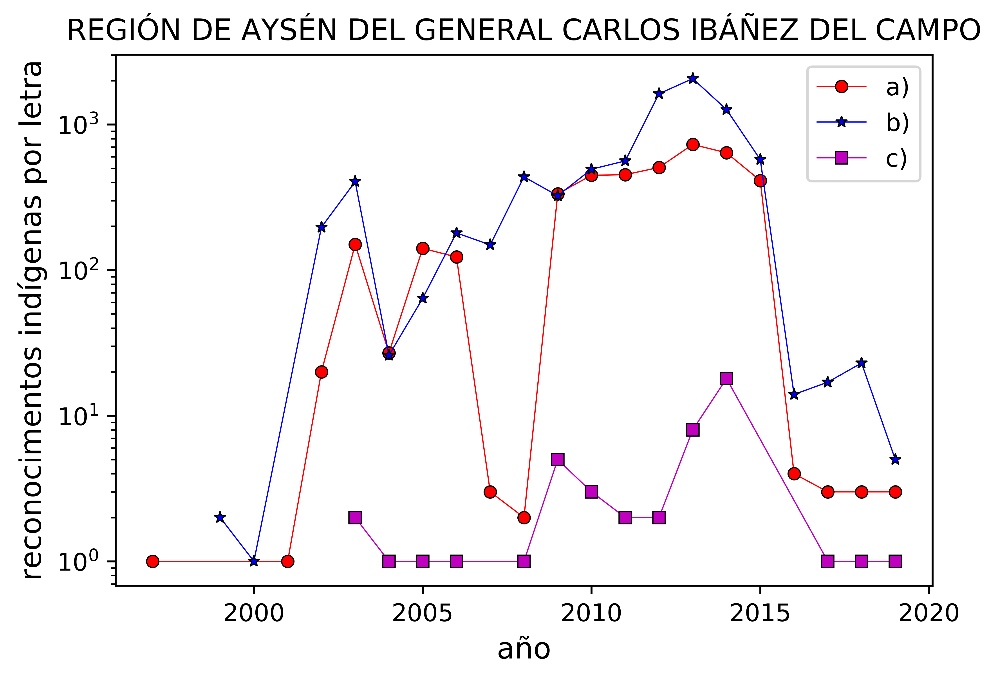

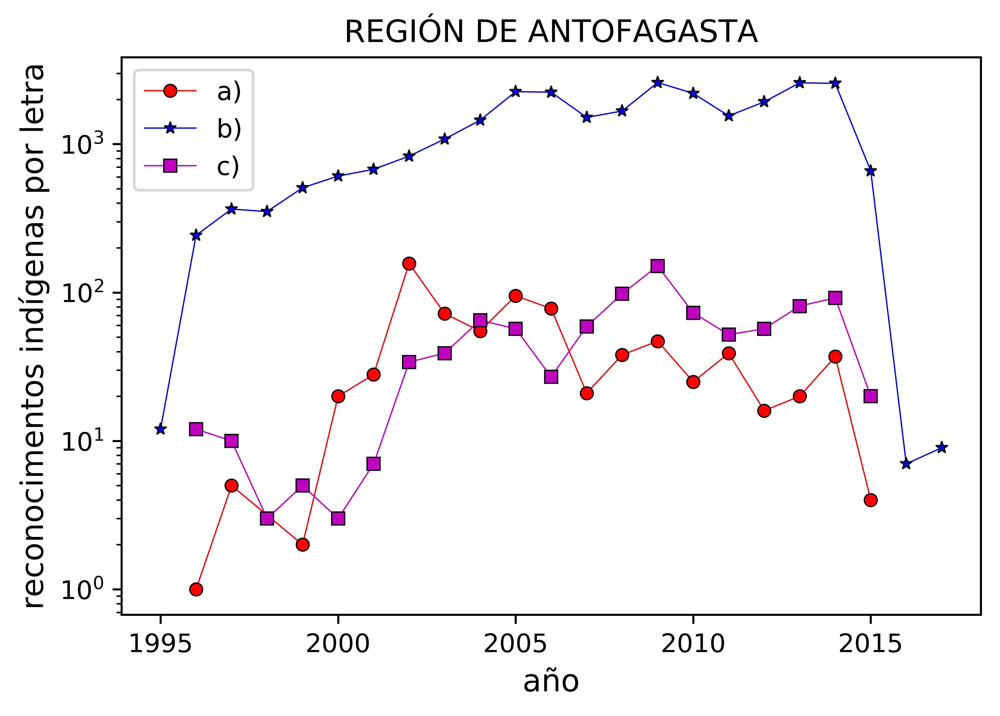

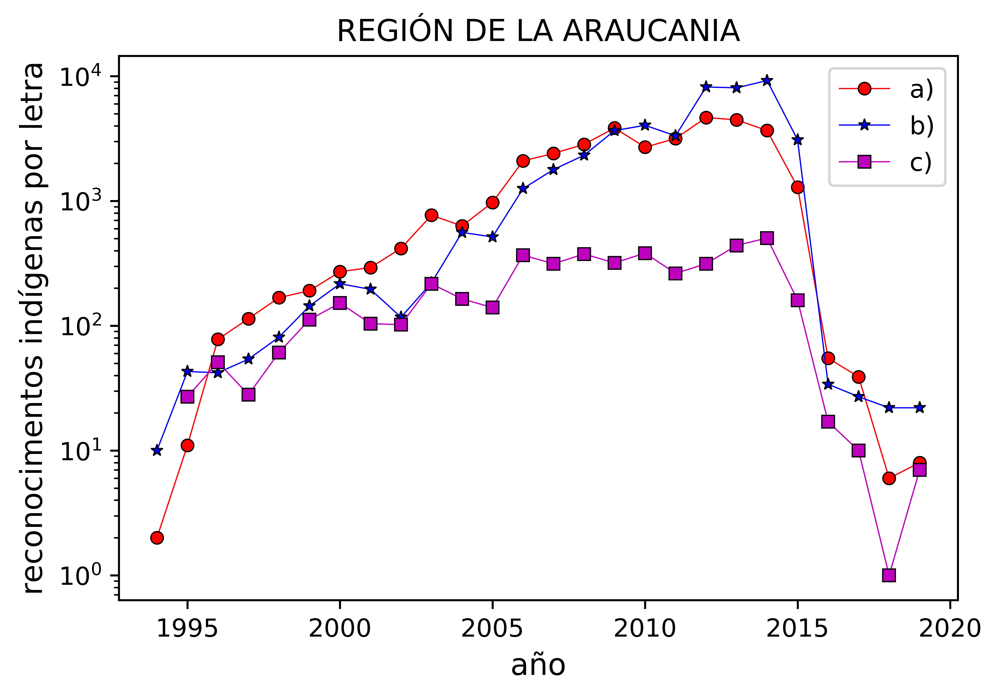

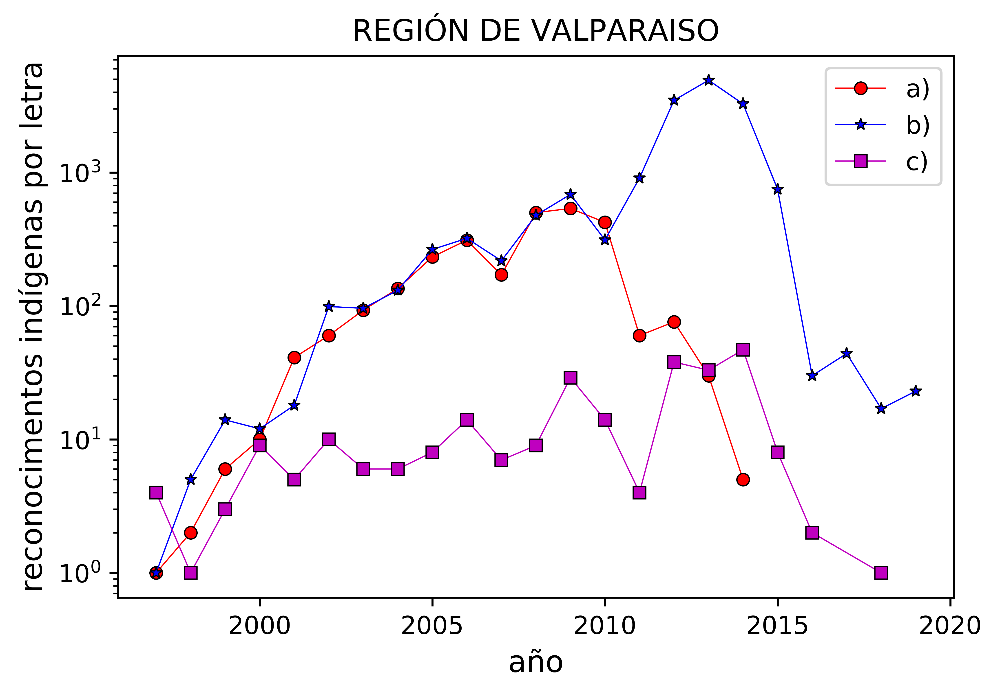

In [21]:
## counts by year by region

for region in set(regions):

    letters=[l for l in df[df.Región==region].Letra]
    years=[y for y in df[df.Región==region].Año]
    
    L=[]

    for l in letters:
        if l.startswith('c)'):
            L+=['c)']
        else:
            L+=[l]
            
    letters_count={l:[] for l in list(set(L))} 

    for i in range(len(L)):
        letters_count[L[i]]+=[years[i]]
        
    letters_count={key:dict(Counter(letters_count[key])) for key in letters_count.keys()}
    letters_count={key:{k: v for k, v in sorted(letters_count[key].items(), key=lambda item: item[0])} for key in letters_count.keys()}
    
    fig, ax = plt.subplots(dpi=800)

    if 'a)' in letters_count.keys():
        plt.semilogy(letters_count['a)'].keys(),letters_count['a)'].values(),marker='o',color='r',markersize=5,markeredgecolor='k',markeredgewidth=0.5,fillstyle='full',clip_on=True,linewidth=0.5,label='a)')
    if 'b)' in letters_count.keys():
        plt.semilogy(letters_count['b)'].keys(),letters_count['b)'].values(),marker='*',color='b',markersize=5,markeredgecolor='k',markeredgewidth=0.5,fillstyle='full',clip_on=True,linewidth=0.5,label='b)')
    if 'c)' in letters_count.keys():
        plt.semilogy(letters_count['c)'].keys(),letters_count['c)'].values(),marker='s',color='m',markersize=5,markeredgecolor='k',markeredgewidth=0.5,fillstyle='full',clip_on=True,linewidth=0.5,label='c)')

    plt.grid(False)
    plt.legend(loc='best')
    plt.title(region)
    #plt.xlim([-4.25,7.25])
    #plt.ylim([-1.75,2.25])
    plt.ylabel(r'reconocimentos indígenas por letra',fontsize=12)
    plt.xlabel(r'año',fontsize=12)
    plt.rcParams.update({'font.size': 10})
    plt.savefig('figuras/frecuencia_reconocimientos_letra_'+region+'.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=800)
    plt.show()

## mapuche surnames

In [22]:
df_s = pd.read_csv('datos/surnames.csv',encoding = 'ISO-8859-1')

In [23]:
df_s

,surname_mapuche,painemal,amigobustos
0,ACACOY,Si,Si
1,ACAMIL,Si,Si
2,ACANAO,Si,Si
3,ACATEN,Si,No
4,ACAYE,Si,No
5,ACAÑIR,Si,Si
6,ACHAO,Si,Si
7,ACHULMAN,Si,No
8,ACHUREO,Si,No
9,ACOIPIL,Si,No


In [24]:
df_mapuche = df[(df['Apellido Paterno'].isin(list(df_s['surname_mapuche']))) | (df['Apellido Materno'].isin(list(df_s['surname_mapuche'])))]

In [25]:
df_mapuche

,Apellido Paterno,Apellido Materno,Nombres,Año,Letra,Comuna,Provincia,Región,Sexo,Oficina
1,ANTILEO,JARAMILLO,TERESA DEL CARMEN,1994,a),TEODORO SCHMIDT,CAUTÍN,REGIÓN DE LA ARAUCANIA,Femenino,SUBDIRECCIÓN NACIONAL TEMUCO
16,QUELEMPÁN,NECULQUEO,JORGE SEGUNDO,1995,a),TEMUCO,CAUTÍN,REGIÓN DE LA ARAUCANIA,Masculino,SUBDIRECCIÓN NACIONAL TEMUCO
17,MILLANAO,CATRIHUAL,HUGO RENÉ,1995,a),LONCOCHE,CAUTÍN,REGIÓN DE LA ARAUCANIA,Masculino,SUBDIRECCIÓN NACIONAL TEMUCO
19,TURREUMAN,LLANCALEO,CARLOS IGNACIO,1995,b),TEMUCO,CAUTÍN,REGIÓN DE LA ARAUCANIA,Masculino,SUBDIRECCIÓN NACIONAL TEMUCO
23,CHIHUAILAF,QUILAQUEO,LAURA ESTER,1996,a),TEMUCO,CAUTÍN,REGIÓN DE LA ARAUCANIA,Femenino,SUBDIRECCIÓN NACIONAL TEMUCO
27,CARIAGA,HUENUHUEQUE,MARCELA EMILIA,1995,a),VICTORIA,MALLECO,REGIÓN DE LA ARAUCANIA,Femenino,SUBDIRECCIÓN NACIONAL TEMUCO
30,FONSECA,NAHUELCHEO,FABIOLA ROMINA,1995,b),TEMUCO,CAUTÍN,REGIÓN DE LA ARAUCANIA,Femenino,SUBDIRECCIÓN NACIONAL TEMUCO
33,HUECHE,FUENTES,MARÍA TERESA,1995,a),TEMUCO,CAUTÍN,REGIÓN DE LA ARAUCANIA,Femenino,SUBDIRECCIÓN NACIONAL TEMUCO
35,QUIAN,FERNÁNDEZ,JOSÉ MANUEL,1995,a),TEMUCO,CAUTÍN,REGIÓN DE LA ARAUCANIA,Masculino,SUBDIRECCIÓN NACIONAL TEMUCO
37,PAINEMILLA,CALFULEO,ADALGUISA FLORENTINA,1995,a),PUERTO SAAVEDRA,CAUTÍN,REGIÓN DE LA ARAUCANIA,Femenino,SUBDIRECCIÓN NACIONAL TEMUCO


## basic mapuche statistics

In [26]:
years=[y for y in df_mapuche.Año]
counts=dict(Counter(years))
counts={k: v for k, v in sorted(counts.items(), key=lambda item: item[0])}

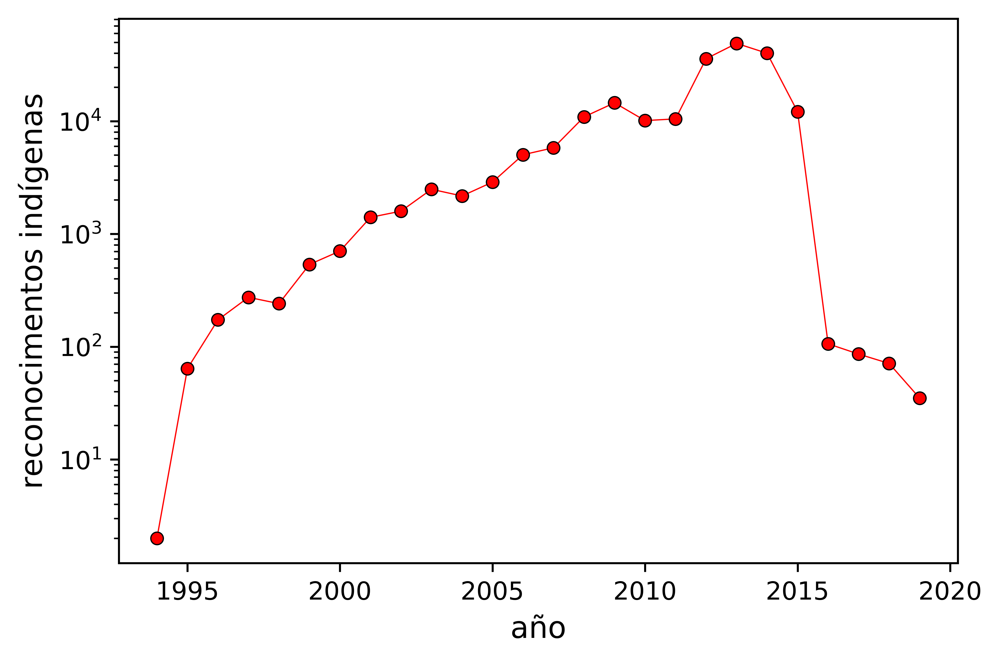

In [27]:
fig, ax = plt.subplots(dpi=800)

#for language in romance_names:

plt.semilogy(counts.keys(),counts.values(),marker='o',color='r',markersize=5,markeredgecolor='k',markeredgewidth=0.5,fillstyle='full',clip_on=True,linewidth=0.5)

plt.grid(False)
#plt.legend(loc='best')
#plt.xlim([-4.25,7.25])
#plt.ylim([-1.75,2.25])
plt.ylabel(r'reconocimentos indígenas',fontsize=12)
plt.xlabel(r'año',fontsize=12)
plt.rcParams.update({'font.size': 10})
plt.savefig('figuras/mapuche/frecuencia_reconocimientos_mapuche.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

In [28]:
## count letters by year

letters=[l for l in df_mapuche.Letra]

In [29]:
L=[]

for l in letters:
    if l.startswith('c)'):
        L+=['c)']
    else:
        L+=[l]

In [30]:
letters_count={l:[] for l in list(set(L))} 

for i in range(len(L)):
    letters_count[L[i]]+=[years[i]]

In [31]:
letters_count={key:dict(Counter(letters_count[key])) for key in letters_count.keys()}

In [32]:
letters_count={key:{k: v for k, v in sorted(letters_count[key].items(), key=lambda item: item[0])} for key in letters_count.keys()}

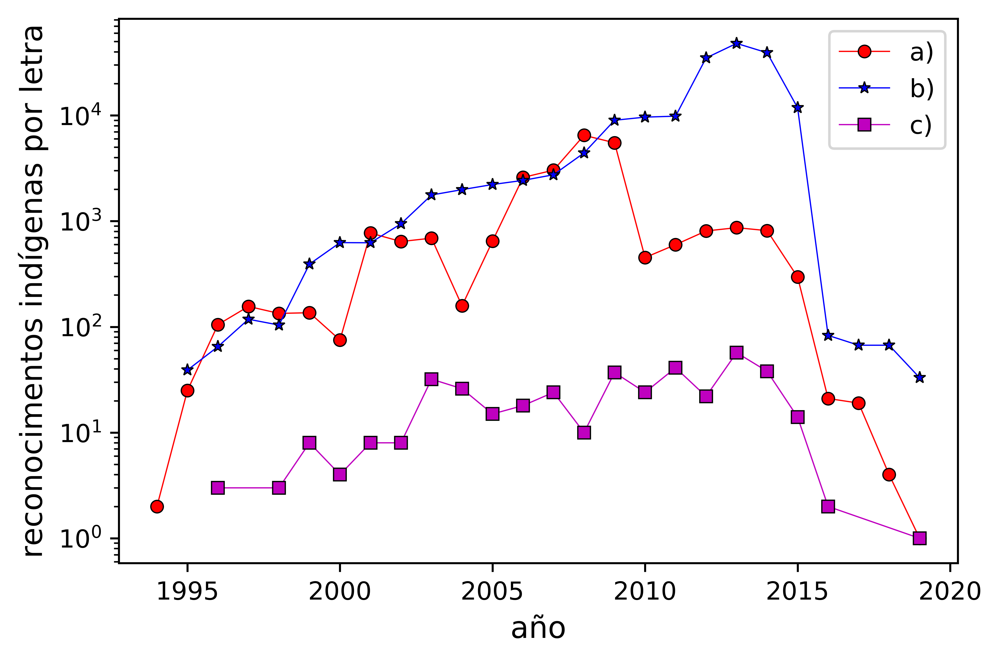

In [33]:
fig, ax = plt.subplots(dpi=800)

#for language in romance_names:

plt.semilogy(letters_count['a)'].keys(),letters_count['a)'].values(),marker='o',color='r',markersize=5,markeredgecolor='k',markeredgewidth=0.5,fillstyle='full',clip_on=True,linewidth=0.5,label='a)')
plt.semilogy(letters_count['b)'].keys(),letters_count['b)'].values(),marker='*',color='b',markersize=5,markeredgecolor='k',markeredgewidth=0.5,fillstyle='full',clip_on=True,linewidth=0.5,label='b)')
plt.semilogy(letters_count['c)'].keys(),letters_count['c)'].values(),marker='s',color='m',markersize=5,markeredgecolor='k',markeredgewidth=0.5,fillstyle='full',clip_on=True,linewidth=0.5,label='c)')

plt.grid(False)
plt.legend(loc='best')
#plt.xlim([-4.25,7.25])
#plt.ylim([-1.75,2.25])
plt.ylabel(r'reconocimentos indígenas por letra',fontsize=12)
plt.xlabel(r'año',fontsize=12)
plt.rcParams.update({'font.size': 10})
plt.savefig('figuras/mapuche/frecuencia_reconocimientos_letra_mapuche.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=800)
plt.show()

## some networks :)

In [34]:
first_surname=list(df_mapuche['Apellido Paterno'])

In [35]:
second_surname=list(df_mapuche['Apellido Materno'])

In [36]:
mapuches=list(df_s['surname_mapuche'])

In [37]:
comunas=list(df_mapuche['Comuna'])

In [38]:
years=[y for y in df_mapuche.Año]

In [39]:
tuple_mapu=[[a,b,c,d] for a,b,c,d in zip(first_surname,second_surname,comunas,years)]

In [40]:
surname_year={y:[] for y in set(years)}

In [41]:
for item in tuple_mapu:
    if item[0] in mapuches:
        surname_year[item[3]]+=[(item[0],item[2])]
    if item[1] in mapuches:
        surname_year[item[3]]+=[(item[1],item[2])]

In [42]:
surname_year[2000][:10]

[('HUAIQUIÑIR', 'NUEVA IMPERIAL'),
 ('CAYUL', 'NUEVA IMPERIAL'),
 ('CAYUQUEO', 'NUEVA IMPERIAL'),
 ('LINCOPAN', 'TEMUCO'),
 ('LINCOPAN', 'TEMUCO'),
 ('CURIVIL', 'CARAHUE'),
 ('COLIHUINCA', 'NUEVA IMPERIAL'),
 ('LONCON', 'NUEVA IMPERIAL'),
 ('MELIHUEN', 'LAUTARO'),
 ('CHEUQUEPAN', 'CURACAUTÍN')]

In [43]:
from networkx.algorithms import bipartite

In [44]:
def GRAPH(year,surnames):
    pairs=surname_year[year]
    G = nx.Graph() 
    
    comunas_list=list(zip(*pairs))[1]
    surnames_list=[s for s in list(zip(*pairs))[0] if s not in comunas_list]
    
    G.add_nodes_from(surnames_list, bipartite=0) # Add the node attribute "bipartite"
    G.add_nodes_from(comunas_list, bipartite=1)
    
    for pair in pairs:
        if pair[0] not in comunas_list:
            if G.has_edge(pair[0],pair[1])==False:
                G.add_edge(pair[0],pair[1],weight=1)
            else:
                x=G[pair[0]][pair[1]]['weight']
                G[pair[0]][pair[1]]['weight']=x+1
    
    G=max(nx.connected_component_subgraphs(G), key=len)
    
    surname_nodes, comuna_nodes = bipartite.sets(G)
            
    if surnames==True:
        G=bipartite.collaboration_weighted_projected_graph(G, surname_nodes)
    elif surnames==False:
        G=bipartite.collaboration_weighted_projected_graph(G, comuna_nodes)
       
    return G

In [47]:
def plot_graph(year,surnames):
    
    G=GRAPH(year,surnames)
    
    G.remove_edges_from(nx.selfloop_edges(G))
    G=nx.k_core(G)
    G=nx.maximum_spanning_tree(G,weight='weight')
    eigen_centrality = nx.eigenvector_centrality(G,weight='weight',max_iter=10000)
    sorted_centrality = list(zip(*sorted(eigen_centrality.items(), key=operator.itemgetter(1),reverse=True)[:25]))[0]
    node_sizes=list(eigen_centrality.values())
   
    pos = nx.kamada_kawai_layout(G)
    labels={i:i for i in sorted_centrality}
    nx.draw_networkx_nodes(G, pos, node_size = [1000*(x+0.01) for x in node_sizes], node_color='orange',linewidths=0.1,alpha=0.85) 
    nx.draw_networkx_edges(G, pos, alpha=0.65,width=0.1,edge_color='cyan')
    nx.draw_networkx_labels(G,pos,labels,alpha=0.65,font_size=3,font_color='k',font_family='monospace')
    plt.axis('off')
    plt.title(year,fontname="Arial",fontsize=9)
    plt.savefig('figuras/mapuche/comunas/bipartite_'+str(year)+str(surnames)+'.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=1080)
    plt.show()

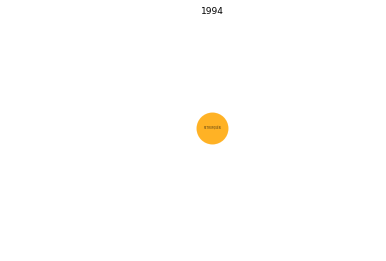

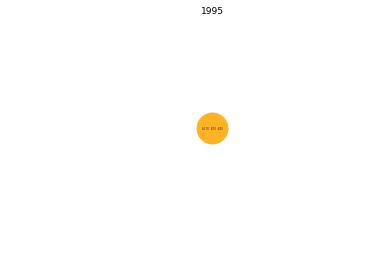

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


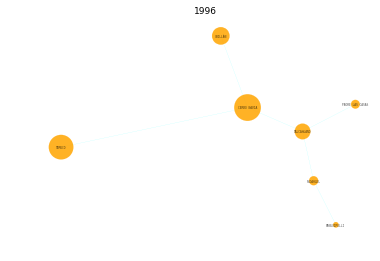

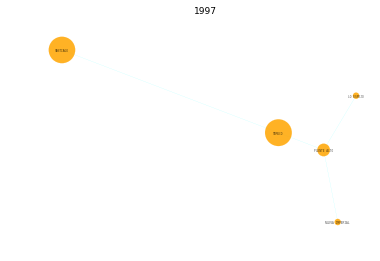

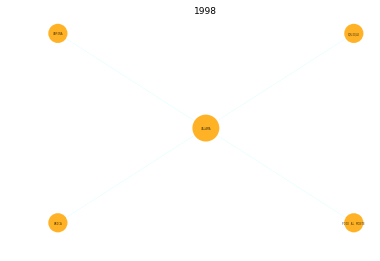

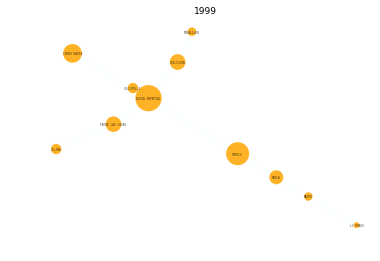

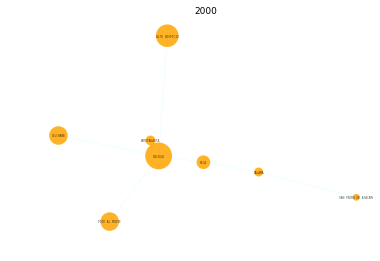

...

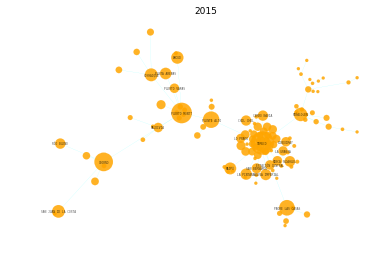

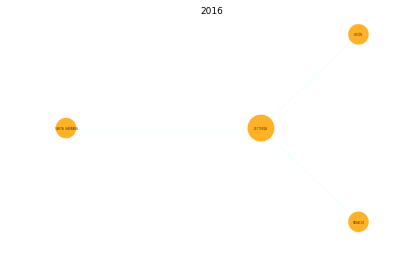

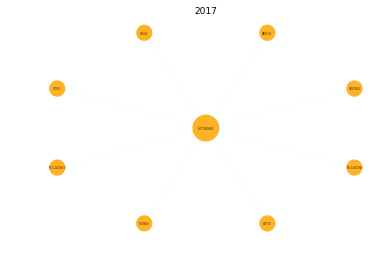

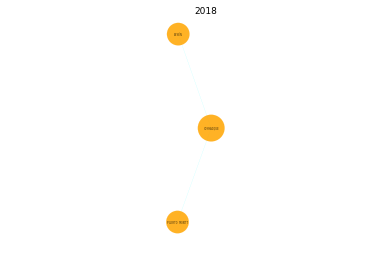

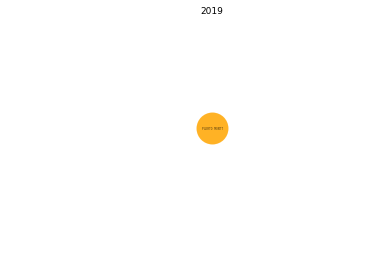

In [48]:
for year in set(years):
    plot_graph(year,False)

In [49]:
regiones=list(df_mapuche['Región'])

In [50]:
tuple_mapu_r=[[a,b,c,d] for a,b,c,d in zip(first_surname,second_surname,regiones,years)]

In [51]:
surname_year_r={y:[] for y in set(years)}

In [52]:
for item in tuple_mapu_r:
    if item[0] in mapuches:
        surname_year_r[item[3]]+=[(item[0],item[2])]
    if item[1] in mapuches:
        surname_year_r[item[3]]+=[(item[1],item[2])]

In [53]:
def GRAPH_r(year,surnames):
    pairs=surname_year_r[year]
    G = nx.Graph() 
    
    comunas_list=list(zip(*pairs))[1]
    surnames_list=[s for s in list(zip(*pairs))[0] if s not in comunas_list]
    
    G.add_nodes_from(surnames_list, bipartite=0) # Add the node attribute "bipartite"
    G.add_nodes_from(comunas_list, bipartite=1)
    
    for pair in pairs:
        if pair[0] not in comunas_list:
            if G.has_edge(pair[0],pair[1])==False:
                G.add_edge(pair[0],pair[1],weight=1)
            else:
                x=G[pair[0]][pair[1]]['weight']
                G[pair[0]][pair[1]]['weight']=x+1
    
    G=max(nx.connected_component_subgraphs(G), key=len)
    
    surname_nodes, comuna_nodes = bipartite.sets(G)
            
    if surnames==True:
        G=bipartite.collaboration_weighted_projected_graph(G, surname_nodes)
    elif surnames==False:
        G=bipartite.collaboration_weighted_projected_graph(G, comuna_nodes)
       
    return G

In [54]:
label_regiones={'DEL LIBERTADOR GENERAL BERNARDO OHIGGINS':'BERNARDO OHIGGINS',
 'ISLA DE PASCUA':'ISLA DE PASCUA',
 'REGIÓN DE ANTOFAGASTA':'ANTOFAGASTA',
 'REGIÓN DE ARICA PARINACOTA':'ARICA',
 'REGIÓN DE ATACAMA':'ATACAMA',
 'REGIÓN DE AYSÉN DEL GENERAL CARLOS IBÁÑEZ DEL CAMPO':'AYSÉN',
 'REGIÓN DE COQUIMBO':'COQUIMBO',
 'REGIÓN DE LA ARAUCANIA':'ARAUCANIA',
 'REGIÓN DE LOS LAGOS':'LOS LAGOS',
 'REGIÓN DE LOS RIOS':'LOS RIOS',
 'REGIÓN DE MAGALLANES Y DE LA ANTÁRTICA CHILENA':'MAGALLANES',
 'REGIÓN DE TARAPACÁ.':'TARAPACÁ',
 'REGIÓN DE VALPARAISO':'VALPARAISO',
 'REGIÓN DEL BÍO BÍO':'BÍO BÍO',
 'REGIÓN METROPOLITANA DE SANTIAGO':'METROPOLITANA',
 'REGIÓN ÑUBLE':'ÑUBLE',
 'VII REGION MAULE':'MAULE'}

In [55]:
def plot_graph_r(year,surnames):
    
    G=GRAPH_r(year,surnames)
    
    #G.remove_edges_from(nx.selfloop_edges(G))
    #G=nx.k_core(G)
    G=nx.maximum_spanning_tree(G,weight='weight')
    eigen_centrality = nx.eigenvector_centrality(G,weight='weight',max_iter=10000)
    sorted_centrality = list(zip(*sorted(eigen_centrality.items(), key=operator.itemgetter(1),reverse=True)[:]))[0]
    node_sizes=list(eigen_centrality.values())
   
    pos = nx.kamada_kawai_layout(G)
    labels={i:label_regiones[i] for i in sorted_centrality}
    nx.draw_networkx_nodes(G, pos, node_size = [1000*(x+0.01) for x in node_sizes], node_color='orange',linewidths=0.1,alpha=0.85) 
    nx.draw_networkx_edges(G, pos, alpha=0.65,width=0.1,edge_color='cyan')
    nx.draw_networkx_labels(G,pos,labels,alpha=0.85,font_size=3,font_color='k',font_family='monospace')
    plt.axis('off')
    plt.title(year,fontname="Arial",fontsize=9)
    plt.savefig('figuras/mapuche/regiones/bipartite_'+str(year)+str(surnames)+'.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=1080)
    plt.show()

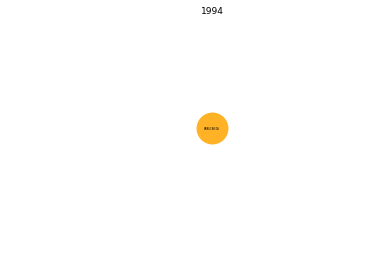

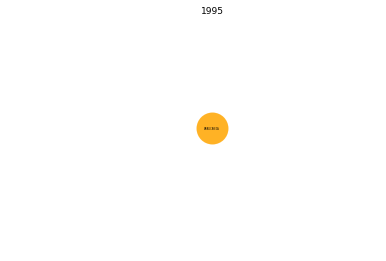

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


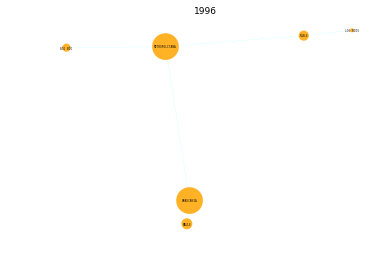

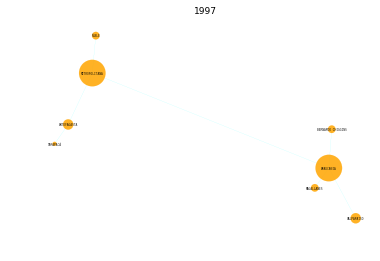

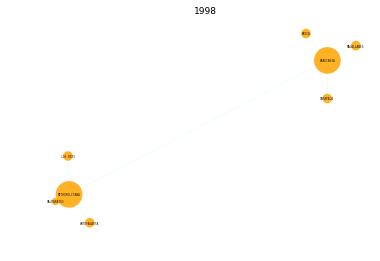

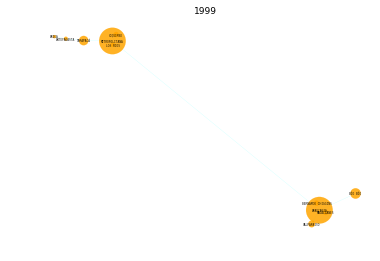

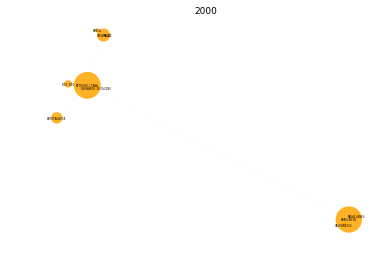

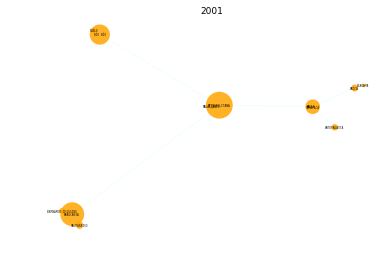

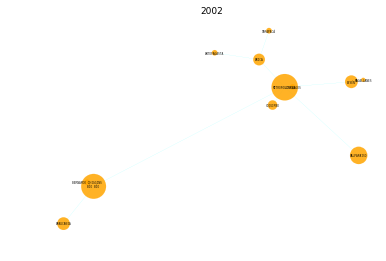

In [ ]:
for year in set(years):
    plot_graph_r(year,False)